#Running MSAF#

We show the main MSAF functionality here, by running it on various toy examples and situations.

In [1]:
import msaf
import librosa
import seaborn as sns

# and IPython.display for audio output
import IPython.display

# Setup nice plots
sns.set(style="dark")
%matplotlib inline

## Single File Mode ##

We run MSAF on a single audio file.

In [2]:
# Choose an audio file and listen to it
audio_file = "../datasets/Sargon/audio/01-Sargon-Mindless.mp3"
IPython.display.Audio(filename=audio_file)

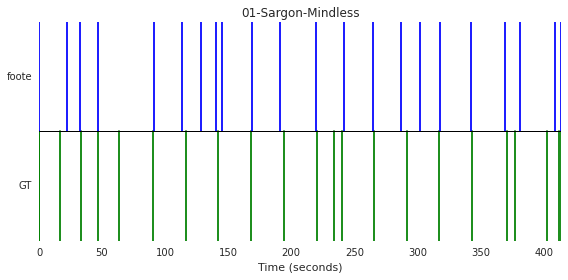

          D    DevE2R    DevR2E  DevtE2R   DevtR2E  HitRate_0.5F  \
0  0.440581  1.908549  1.905601   2.0072  2.102902      0.133333   

   HitRate_0.5P  HitRate_0.5R  HitRate_3F  HitRate_3P  HitRate_3R  \
0      0.136364      0.130435    0.622222    0.636364    0.608696   

   HitRate_t0.5F  HitRate_t0.5P  HitRate_t0.5R  HitRate_t3F  HitRate_t3P  \
0        0.04878           0.05       0.047619     0.585366          0.6   

   HitRate_t3R                  ds_name            track_id  
0     0.571429  01-Sargon-Mindless.jams  01-Sargon-Mindless  


In [6]:
# Segment the file using the Foote method, and Pitch Class Profiles for the features
results = msaf.process(audio_file, feature="hpcp", boundaries_id="foote", plot=True)

# Evaluate the results. It returns a pandas data frame.
evaluations = msaf.eval.process(audio_file, boundaries_id="foote", feature="hpcp")
print evaluations

In [ ]:
# Listen to the boundaries
results = msaf.process(audio_file, feature="hpcp", labels_id="fmc2d", plot=True, sonify_bounds=True)

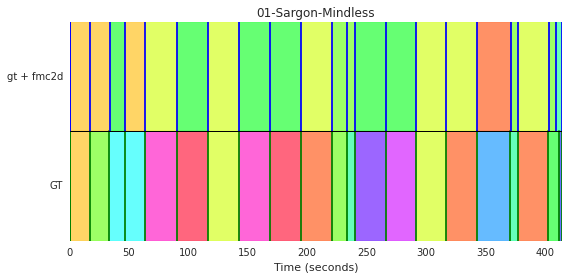

        D   DevE2R   DevR2E   DevtE2R   DevtR2E  HitRate_0.5F  HitRate_0.5P  \
0  0.6636  0.09288  0.09288  0.095624  0.095624      0.956522      0.956522   

   HitRate_0.5R  HitRate_3F  HitRate_3P         ...          HitRate_t3P  \
0      0.956522           1           1         ...                    1   

   HitRate_t3R       PWF       PWP       PWR        Sf        So        Su  \
0            1  0.478105  0.329532  0.870641  0.680839  0.885355  0.553078   

                   ds_name            track_id  
0  01-Sargon-Mindless.jams  01-Sargon-Mindless  

[1 rows x 25 columns]


In [8]:
# Label the file using the 2D-FMC method, and Pitch Class Profiles for the features
results = msaf.process(audio_file, feature="hpcp", labels_id="fmc2d", plot=True)

# Evaluate the results. It returns a pandas data frame.
evaluations = msaf.eval.process(audio_file, boundaries_id="gt", labels_id="fmc2d", feature="hpcp")
print evaluations

### Explore Algorithm Parameters ###
Now let's modify the configuration of one of the files, and modify it to see how different the results are.
We will use the Widgets, which will become handy here.

In [4]:
# First, check which are foote's algorithm parameters:
print msaf.algorithms.foote.config

{'m_median': 12, 'L_peaks': 64, 'M_gaussian': 96}


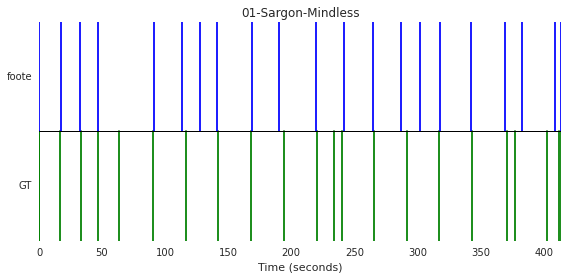

          D    DevE2R    DevR2E   DevtE2R   DevtR2E  HitRate_0.5F  \
0  0.443445  1.431769  1.431769  1.487642  1.493537      0.181818   

   HitRate_0.5P  HitRate_0.5R  HitRate_3F  HitRate_3P  HitRate_3R  \
0      0.190476      0.173913    0.727273    0.761905    0.695652   

   HitRate_t0.5F  HitRate_t0.5P  HitRate_t0.5R  HitRate_t3F  HitRate_t3P  \
0            0.1       0.105263       0.095238          0.7     0.736842   

   HitRate_t3R                  ds_name            track_id  
0     0.666667  01-Sargon-Mindless.jams  01-Sargon-Mindless  


In [14]:
# play around with IPython.Widgets
from IPython.html.widgets import interact

# Obtain the default configuration
bid = "foote"  # Boundaries ID
lid = None     # Labels ID
feature = "hpcp"
config = msaf.io.get_configuration(feature, annot_beats=False, framesync=False, boundaries_id=bid, labels_id=lid)

# Sweep M_gaussian parameters
@interact(M_gaussian=(50, 500, 25))
def _run_msaf(M_gaussian):
    # Set the configuration
    config["M_gaussian"] = M_gaussian
    
    # Segment the file using the Foote method, and Pitch Class Profiles for the features
    results = msaf.process(audio_file, feature=feature, boundaries_id=bid, config=config, plot=True)

    # Evaluate the results. It returns a pandas data frame.
    evaluations = msaf.eval.process(audio_file, boundaries_id="foote", feature="hpcp", config=config)
    print evaluations